In [5]:
import tensorflow_datasets as tfds
import tensorflow as tf

(raw_train, raw_validation, raw_test), metadata = tfds.load(
    'tf_flowers',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    with_info=True,
    as_supervised=True,
)

In [6]:
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

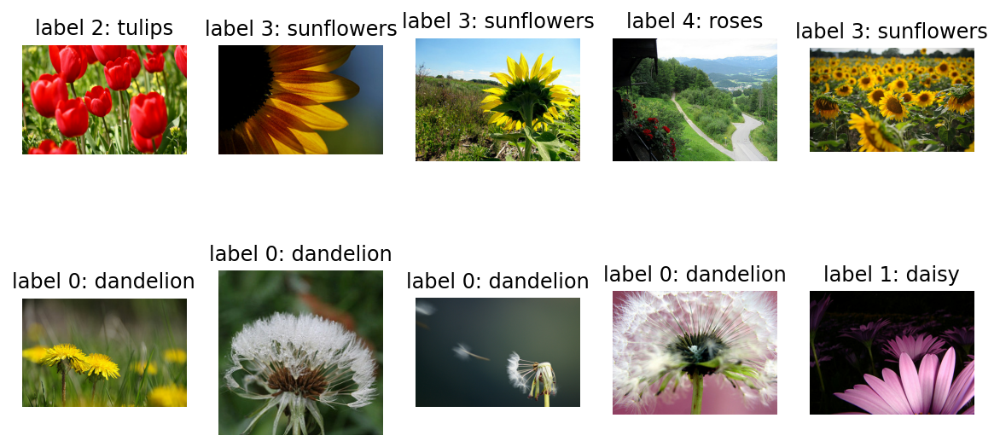

In [7]:
plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [8]:
IMG_SIZE = 160 # All images will be resized to 160x160

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/127.5) - 1
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

In [9]:
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

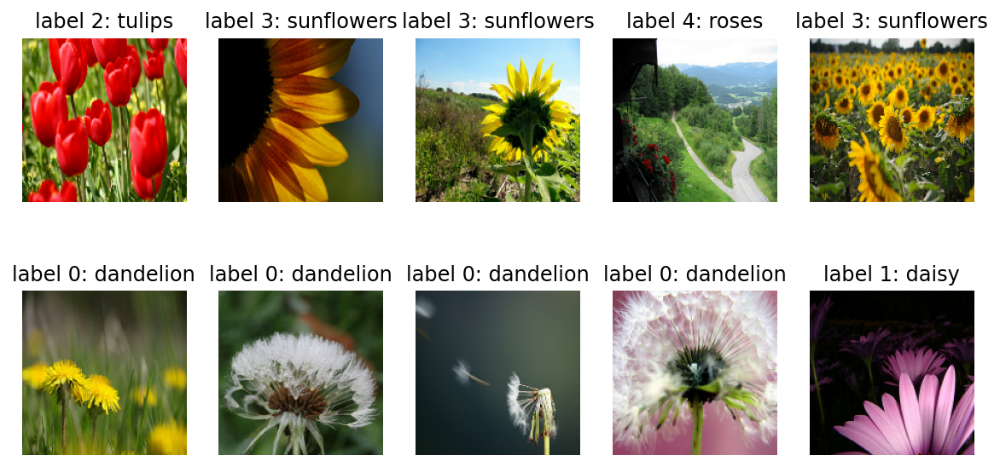

In [31]:
plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [32]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D

In [42]:
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dense(units=5, activation='softmax')
])

In [43]:
import numpy as np

image = np.array([[1, 2], [3, 4]])
print(image.shape)
image

(2, 2)


array([[1, 2],
       [3, 4]])

In [44]:
image.flatten()

array([1, 2, 3, 4])

In [45]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [46]:
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000

In [47]:
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

In [48]:
for image_batch, label_batch in train_batches.take(1):
    pass

image_batch.shape

#print(train_batches)
#print(validation_batches)


TensorShape([32, 160, 160, 3])

In [49]:
validation_steps = 3
loss0, accuracy0 = model.evaluate(validation_batches, steps=validation_steps)

print("initial loss: {:.4f}".format(loss0))
print("initial accuracy: {:.4f}".format(accuracy0))

3/3 [==============================] - 0s 9ms/step - loss: 1.6261 - accuracy: 0.1771
initial loss: 1.6261
initial accuracy: 0.1771


In [50]:
EPOCHS = 10
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/10
92/92 [==============================] - 3s 28ms/step - loss: 1.3358 - accuracy: 0.4261 - val_loss: 1.0922 - val_accuracy: 0.5504
Epoch 2/10
92/92 [==============================] - 2s 26ms/step - loss: 1.0502 - accuracy: 0.5743 - val_loss: 1.0961 - val_accuracy: 0.5177
Epoch 3/10
92/92 [==============================] - 2s 27ms/step - loss: 0.9292 - accuracy: 0.6301 - val_loss: 1.0714 - val_accuracy: 0.5531
Epoch 4/10
92/92 [==============================] - 3s 29ms/step - loss: 0.8285 - accuracy: 0.7016 - val_loss: 1.0379 - val_accuracy: 0.5749
Epoch 5/10
92/92 [==============================] - 3s 29ms/step - loss: 0.7403 - accuracy: 0.7183 - val_loss: 1.0196 - val_accuracy: 0.6185
Epoch 6/10
92/92 [==============================] - 2s 26ms/step - loss: 0.6419 - accuracy: 0.7694 - val_loss: 0.8836 - val_accuracy: 0.6649
Epoch 7/10
92/92 [==============================] - 2s 26ms/step - loss: 0.5645 - accuracy: 0.8099 - val_loss: 1.0081 - val_accuracy: 0.5913
Epoch 8/10
92

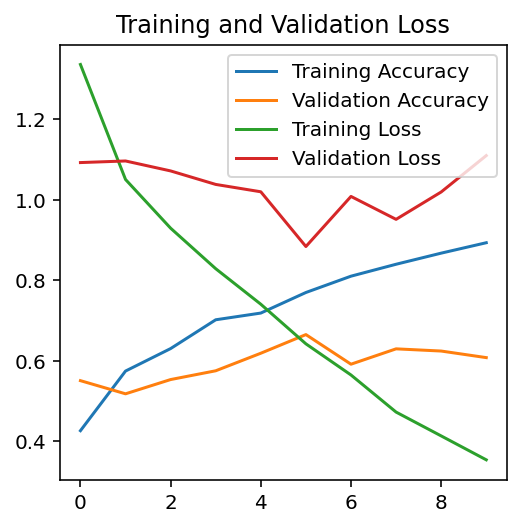

In [51]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(4, 4))
plt.subplot(1, 1, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

#plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [52]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[2.52832135e-04, 5.38016087e-04, 9.63347971e-01, 8.10046773e-03,
        2.77606100e-02],
       [6.40217543e-01, 3.22125465e-01, 3.45303342e-02, 9.85061124e-05,
        3.02810688e-03],
       [1.90647259e-01, 5.20059206e-02, 5.38697779e-01, 2.16933101e-01,
        1.71590818e-03],
       [8.98692384e-03, 2.87711471e-01, 6.23172283e-01, 3.64238885e-03,
        7.64869601e-02],
       [5.78166068e-01, 1.92818522e-01, 9.05924216e-02, 1.72735881e-02,
        1.21149383e-01],
       [2.96536535e-01, 3.65053147e-01, 1.61174595e-01, 1.32185966e-02,
        1.64017186e-01],
       [1.94080480e-04, 2.46301908e-02, 9.67658341e-01, 5.15324820e-04,
        7.00211665e-03],
       [1.15798436e-01, 9.69402194e-02, 3.46835762e-01, 2.86086295e-02,
        4.11816925e-01],
       [1.59341877e-03, 1.05547355e-04, 2.96385922e-02, 9.68611538e-01,
        5.09743295e-05],
       [9.48890626e-01, 3.88295352e-02, 5.09355357e-03, 8.75667465e-05,
        7.09877769e-03],
       [9.46866453e-01, 1.8534

In [53]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([2, 0, 2, 2, 0, 1, 2, 4, 3, 0, 0, 3, 3, 2, 4, 3, 2, 3, 1, 2, 2, 1,
       2, 1, 1, 2, 2, 1, 2, 1, 0, 2])

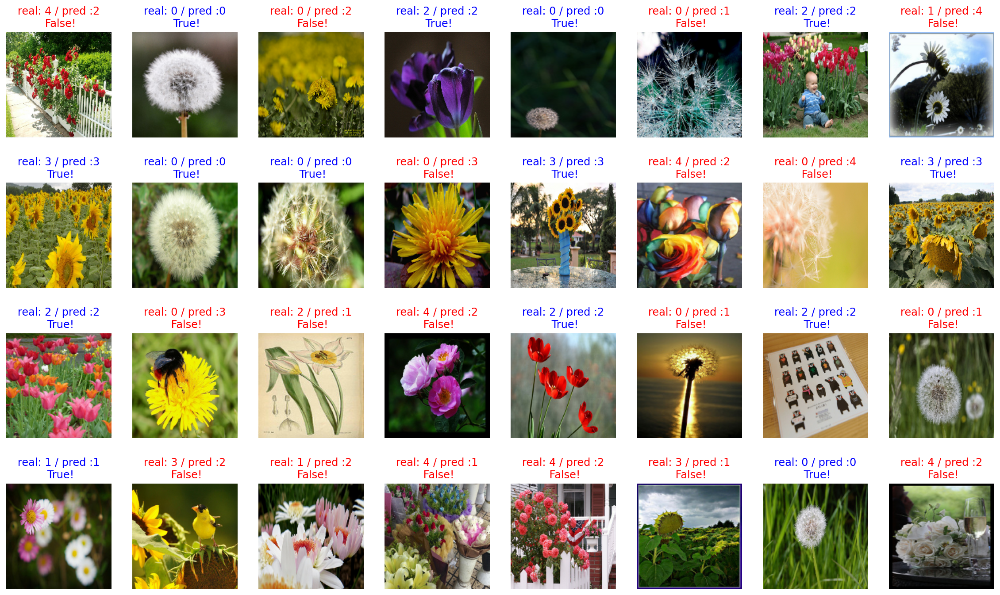

In [54]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [55]:
count = 0   # 정답을 맞춘 개수
for image, label, prediction in zip(images, labels, predictions):
    image = (image + 1) / 2
    correct = (label == prediction)
    if correct:
        count = count + 1

print(count / 32 * 100, '%')

43.75 %


In [56]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

In [57]:
image_batch.shape

TensorShape([32, 160, 160, 3])

In [58]:
feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([32, 5, 5, 512])

In [59]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 160, 160, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 160, 160, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 160, 160, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 80, 80, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 80, 80, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 80, 80, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 40, 40, 128)       0     

In [60]:
feature_batch.shape

TensorShape([32, 5, 5, 512])

In [61]:
import numpy as np

image = np.array([[1, 2],
                  [3, 4]])

flattened_image = image.flatten()

print("Original image:\n", image)
print("Original image shape:", image.shape)
print()
print("Flattened image:\n", flattened_image)
print("Flattened image shape:", flattened_image.shape)

Original image:
 [[1 2]
 [3 4]]
Original image shape: (2, 2)

Flattened image:
 [1 2 3 4]
Flattened image shape: (4,)


In [62]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

In [63]:
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 512)


In [82]:
dense_layer = tf.keras.layers.Dense(512, activation='relu')
prediction_layer = tf.keras.layers.Dense(5, activation='softmax')

# feature_batch_averag가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer(feature_batch_average))  
print(prediction_batch.shape)

(32, 5)


In [83]:
base_model.trainable = False

In [84]:
model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
])

In [85]:
model.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 5, 5, 512)         14714688  
_________________________________________________________________
global_average_pooling2d (Gl (None, 512)               0         
_________________________________________________________________
dense_8 (Dense)              (None, 512)               262656    
_________________________________________________________________
dense_9 (Dense)              (None, 5)                 2565      
Total params: 14,979,909
Trainable params: 265,221
Non-trainable params: 14,714,688
_________________________________________________________________


In [86]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [88]:
validation_steps=10
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

10/10 [==============================] - 1s 53ms/step - loss: 1.6564 - accuracy: 0.1937
initial loss: 1.66
initial accuracy: 0.19


In [111]:
EPOCHS = 20   # 이번에는 이전보다 훨씬 빠르게 수렴되므로 5Epoch이면 충분합니다.

history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/20
92/92 [==============================] - 7s 75ms/step - loss: 0.4535 - accuracy: 0.8522 - val_loss: 0.5154 - val_accuracy: 0.8174
Epoch 2/20
92/92 [==============================] - 7s 73ms/step - loss: 0.4421 - accuracy: 0.8559 - val_loss: 0.5081 - val_accuracy: 0.8338
Epoch 3/20
92/92 [==============================] - 7s 74ms/step - loss: 0.4329 - accuracy: 0.8597 - val_loss: 0.5070 - val_accuracy: 0.8229
Epoch 4/20
92/92 [==============================] - 7s 74ms/step - loss: 0.4242 - accuracy: 0.8651 - val_loss: 0.5075 - val_accuracy: 0.8229
Epoch 5/20
92/92 [==============================] - 7s 74ms/step - loss: 0.4165 - accuracy: 0.8658 - val_loss: 0.4915 - val_accuracy: 0.8229
Epoch 6/20
92/92 [==============================] - 7s 75ms/step - loss: 0.4077 - accuracy: 0.8665 - val_loss: 0.4878 - val_accuracy: 0.8311
Epoch 7/20
92/92 [==============================] - 7s 74ms/step - loss: 0.4014 - accuracy: 0.8699 - val_loss: 0.4857 - val_accuracy: 0.8338
Epoch 8/20
92

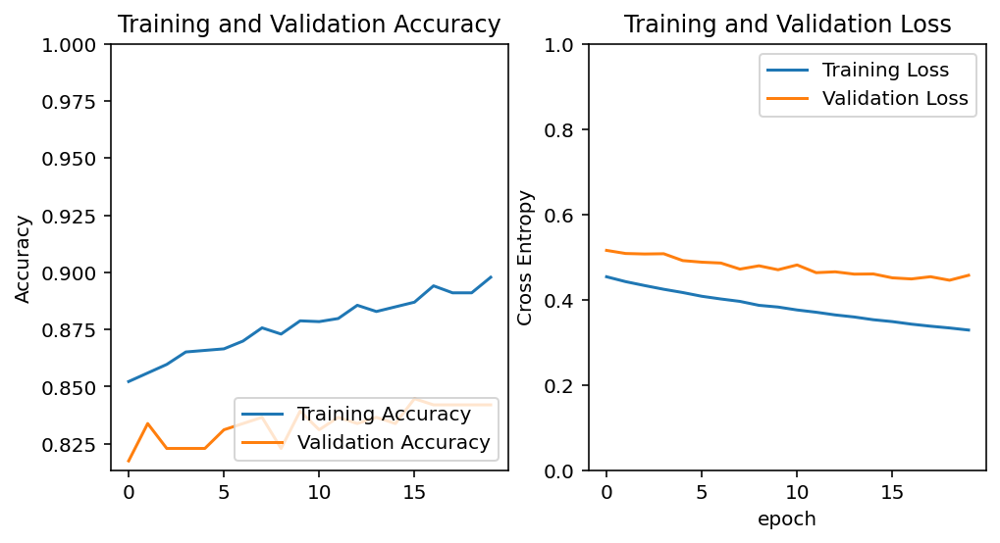

In [112]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [113]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[6.42978121e-03, 2.70292051e-02, 8.17796171e-01, 1.16137145e-02,
        1.37131110e-01],
       [9.99899745e-01, 9.32928451e-05, 1.76209383e-07, 1.08059965e-06,
        5.60810213e-06],
       [7.35793531e-01, 1.33265764e-01, 8.93671159e-03, 1.06362648e-01,
        1.56413317e-02],
       [5.68800606e-04, 2.09205667e-03, 4.89121795e-01, 1.24602811e-03,
        5.06971300e-01],
       [7.35460758e-01, 2.39669383e-01, 4.16448154e-03, 9.35971923e-03,
        1.13456594e-02],
       [9.62615311e-01, 2.72168033e-02, 9.54214076e-04, 8.90906341e-03,
        3.04642133e-04],
       [3.84999090e-03, 3.07303877e-03, 9.42384243e-01, 2.80811843e-02,
        2.26115268e-02],
       [4.22896683e-01, 5.49593687e-01, 1.45423881e-04, 2.67198104e-02,
        6.44439075e-04],
       [1.68472528e-03, 1.33166584e-04, 6.38590101e-03, 9.62124109e-01,
        2.96721160e-02],
       [9.99835372e-01, 1.60882817e-04, 8.66828529e-08, 3.25045517e-06,
        3.98369366e-07],
       [9.80435610e-01, 1.7945

In [114]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([2, 0, 0, 4, 0, 0, 2, 1, 3, 0, 0, 3, 3, 4, 0, 3, 2, 0, 2, 4, 2, 0,
       1, 0, 1, 3, 2, 4, 4, 3, 0, 4])

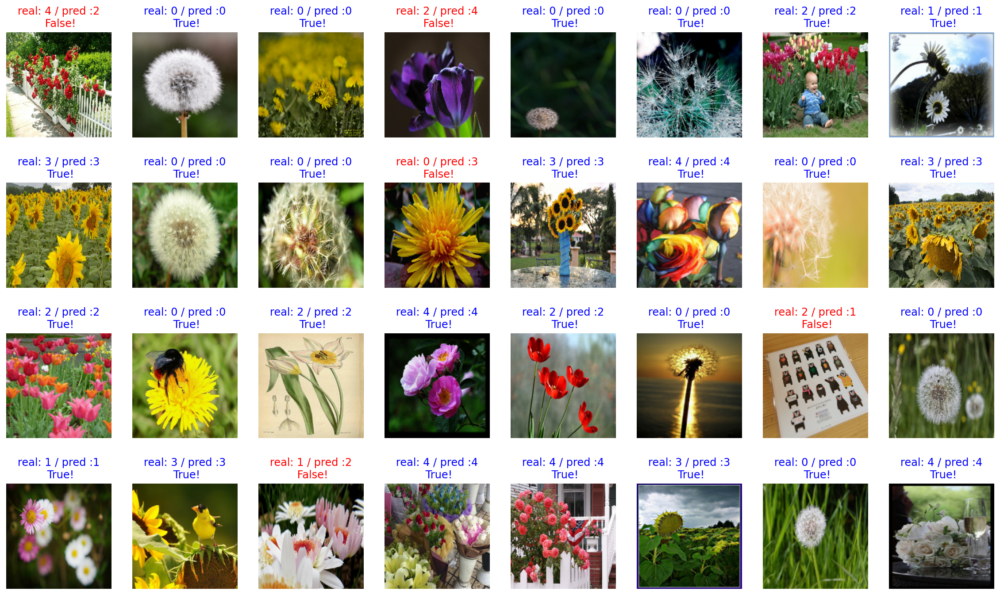

In [115]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [116]:
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100) # 약 95% 내외

84.375
